<a href="https://colab.research.google.com/github/Mahantesh-Pattadkal-1993/CounterFactuals_GANs/blob/main/Training_the_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [2]:
import os
os.chdir('/content/gdrive/My Drive/Github')

In [20]:
# Cloning the GitHub repo so that I dont have to upload everything here
#!git clone https://github.com/Mahantesh-Pattadkal-1993/CounterFactuals_GANs.git


Cloning into 'CounterFactuals_GANs'...
remote: Enumerating objects: 46, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 46 (delta 5), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (46/46), done.


In [3]:
#Setting up the path for GAN Training
import os
os.chdir('/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST')

In [4]:
#Import the libraries 
import torch
import torch.optim as opt
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms

import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from GAN_Models import DC_Generator, DC_Discriminator



# Set random seed for reproducibility
manualSeed = 2021
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)


Random Seed:  2021


In [5]:
#Loading the data

mb_size = 64

transform = transforms.ToTensor()

trainData = torchvision.datasets.MNIST('./data/', download=True, transform=transform, train=True)

trainLoader = torch.utils.data.DataLoader(trainData, shuffle=True, batch_size=mb_size)

/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


In [6]:
dataIter = iter(trainLoader)

imgs, labels = dataIter.next()

In [7]:
imgs.shape

torch.Size([64, 1, 28, 28])

In [8]:
def imshow(imgs):
    imgs = torchvision.utils.make_grid(imgs) # makes grid of the tensor images passed
    npimgs = imgs.numpy()
    plt.figure(figsize=(8,8))
    plt.imshow(np.transpose(npimgs, (1,2,0)), cmap='Greys_r')
    plt.xticks([])
    plt.yticks([])
    plt.show()

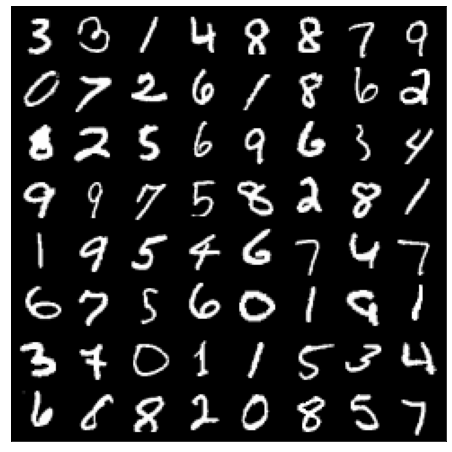

In [9]:
imshow(imgs)

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # PyTorch v0.4.0

G = DC_Generator(nc=1,nz=100,ngf=28).to(device)
D = DC_Discriminator(nc=1,ndf =28).to(device)

lr = 1e-3

g_opt = opt.Adam(G.parameters(), lr=lr)
d_opt = opt.Adam(D.parameters(), lr=lr)

In [13]:
# This cell can be used to check the architecture of the network

from torchsummary import summary

#model = G(nc=1,nz=100,ngf=28).to(device)
#input for Generator = (bs,100,1,1)
#bs =64
#summary(G,(bs,100,1,1))

summary(D, (1,28,28))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 28, 14, 14]             448
         LeakyReLU-2           [-1, 28, 14, 14]               0
            Conv2d-3             [-1, 56, 7, 7]          25,088
       BatchNorm2d-4             [-1, 56, 7, 7]             112
         LeakyReLU-5             [-1, 56, 7, 7]               0
            Conv2d-6            [-1, 112, 4, 4]          56,448
       BatchNorm2d-7            [-1, 112, 4, 4]             224
         LeakyReLU-8            [-1, 112, 4, 4]               0
            Conv2d-9              [-1, 1, 1, 1]           1,792
          Sigmoid-10              [-1, 1, 1, 1]               0
Total params: 84,112
Trainable params: 84,112
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.19
Params size (MB): 0.32
Estimated Tot

In [14]:
#Setting up the tensorboard
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/GAN_trial_08_21')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:0,   G_loss:8.056089142555875,    D_loss:0.03021533463219082


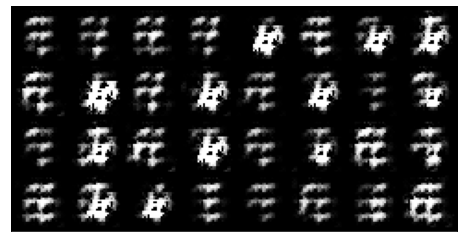

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:1,   G_loss:7.900825429826911,    D_loss:0.02799056503643244


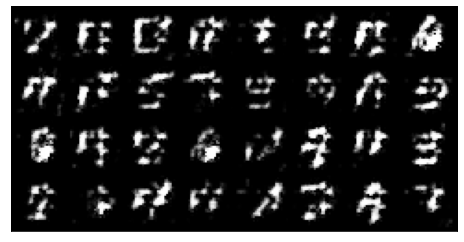

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:2,   G_loss:7.966496355498015,    D_loss:0.02611287148637838


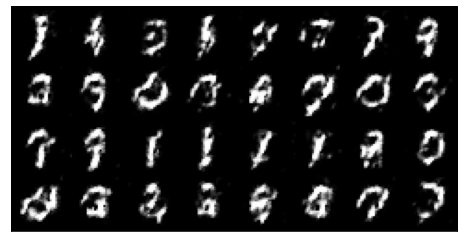

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:3,   G_loss:7.330980215372561,    D_loss:0.03865341923820393


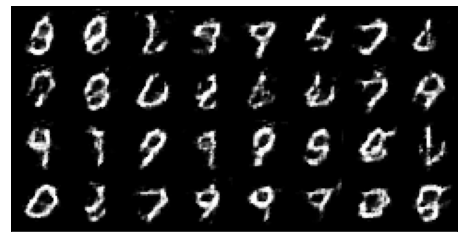

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:4,   G_loss:7.077699980501936,    D_loss:0.05684159503334255


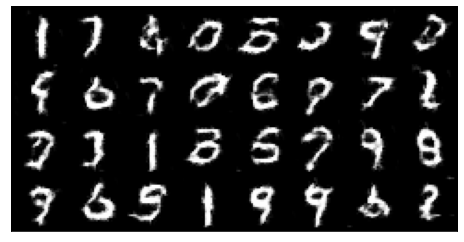

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:5,   G_loss:5.459825070682111,    D_loss:0.10213137903898112


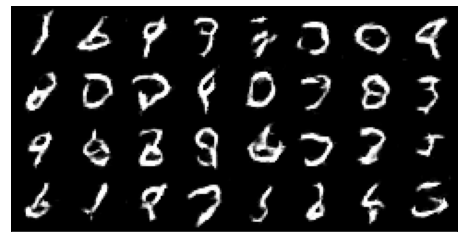

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:6,   G_loss:5.0576277385388355,    D_loss:0.16687323983191754


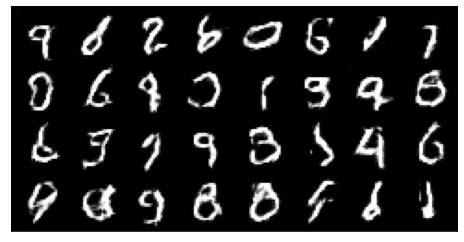

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:7,   G_loss:4.428660487887194,    D_loss:0.18403986628367894


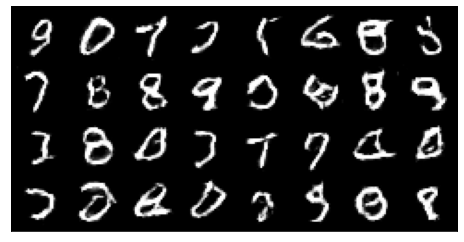

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:8,   G_loss:4.304650774150134,    D_loss:0.1910863387406365


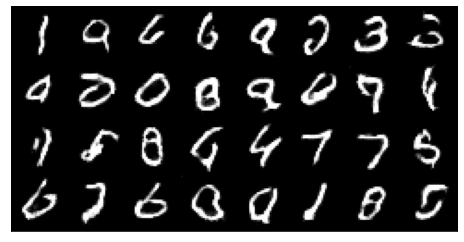

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:9,   G_loss:4.239000630785407,    D_loss:0.18215341977119795


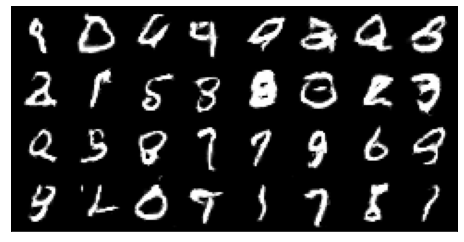

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:10,   G_loss:4.3102666135789995,    D_loss:0.18337926519677233


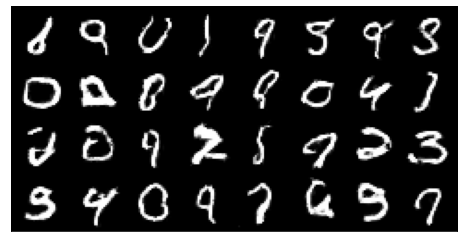

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:11,   G_loss:4.311531384997784,    D_loss:0.20433516535701465


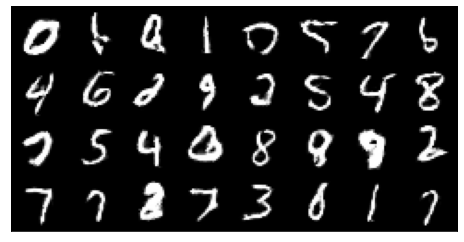

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:12,   G_loss:4.253183292046285,    D_loss:0.17827584990647746


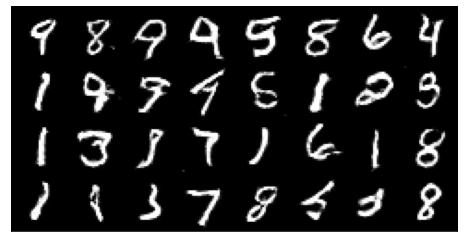

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:13,   G_loss:4.221765899963216,    D_loss:0.19497483980649316


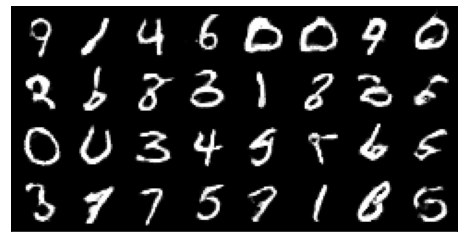

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:14,   G_loss:4.198181390444607,    D_loss:0.2436726729709234


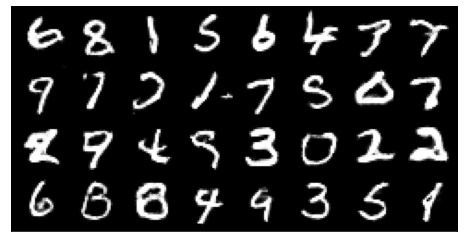

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:15,   G_loss:4.331854891802457,    D_loss:0.16288443468312527


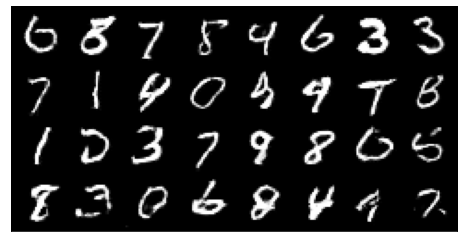

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:16,   G_loss:4.357652925669766,    D_loss:0.20991406389383047


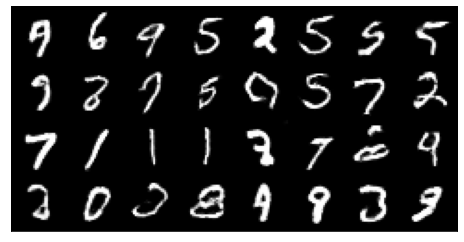

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:17,   G_loss:4.287429311636414,    D_loss:0.17558841309798107


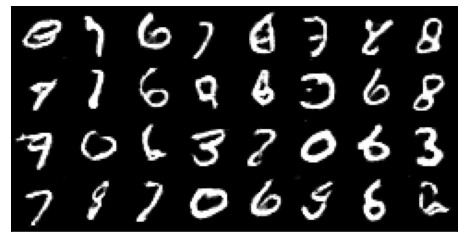

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:18,   G_loss:4.434446218298443,    D_loss:0.18425097146671193


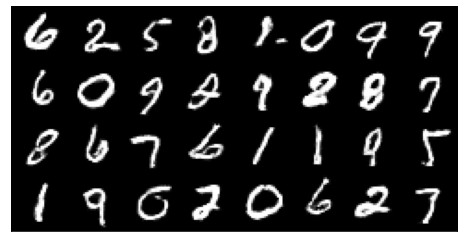

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:19,   G_loss:4.507797165338927,    D_loss:0.1710885407607645


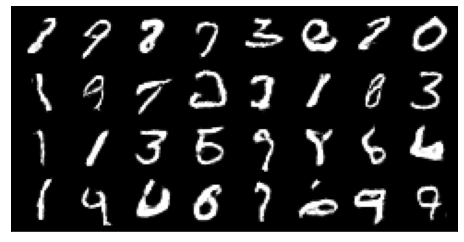

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:20,   G_loss:4.58300565809075,    D_loss:0.1815186737558004


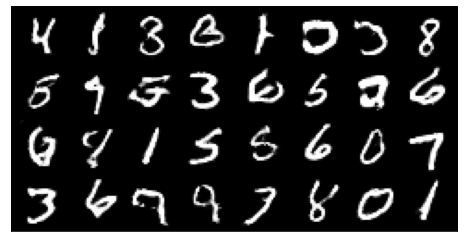

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:21,   G_loss:4.485454509793314,    D_loss:0.20399939378937965


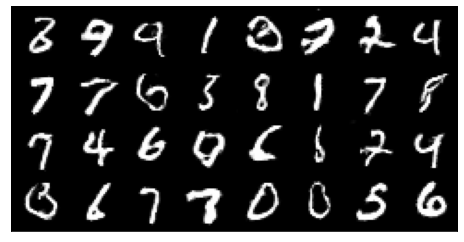

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:22,   G_loss:4.596910854773735,    D_loss:0.16059971637457912


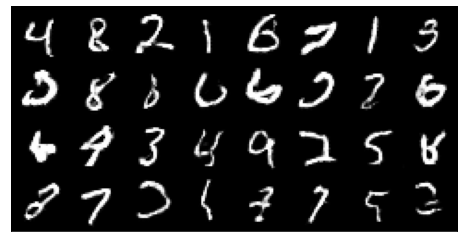

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:23,   G_loss:4.5637321193208065,    D_loss:0.14629507103343126


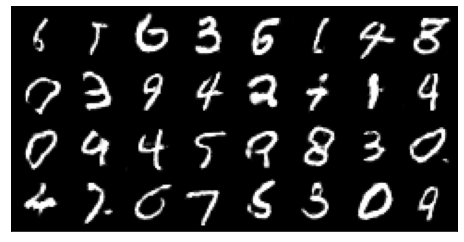

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:24,   G_loss:4.5045884612209,    D_loss:0.18763203669770329


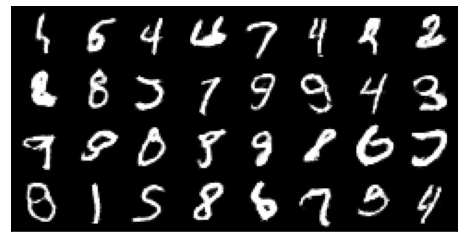

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:25,   G_loss:4.6320666173246625,    D_loss:0.1423718505722683


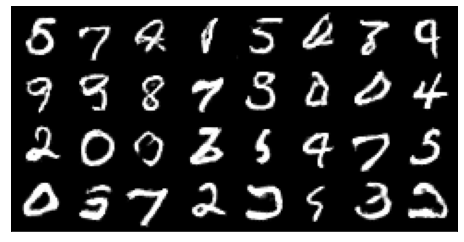

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:26,   G_loss:4.717659822341476,    D_loss:0.17623922570066444


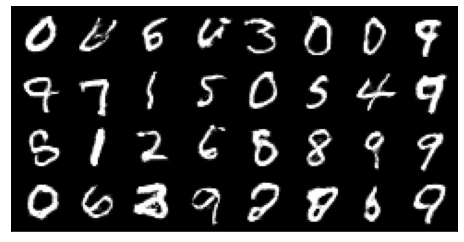

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:27,   G_loss:4.576440487843333,    D_loss:0.20322272054819282


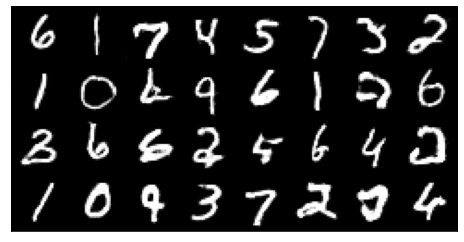

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:28,   G_loss:4.7500098670946,    D_loss:0.14631198736519288


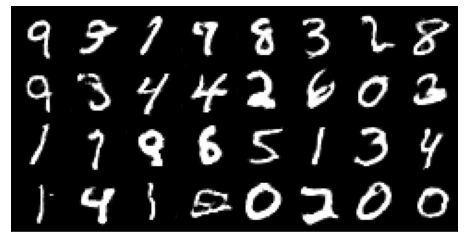

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:29,   G_loss:4.859372296567156,    D_loss:0.18000557359907704


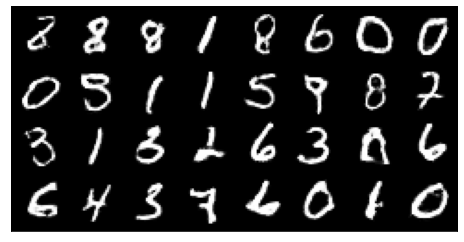

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:30,   G_loss:4.670620267325119,    D_loss:0.13544858007459468


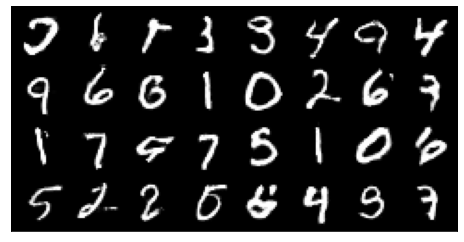

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:31,   G_loss:4.640067271332242,    D_loss:0.20006572481230903


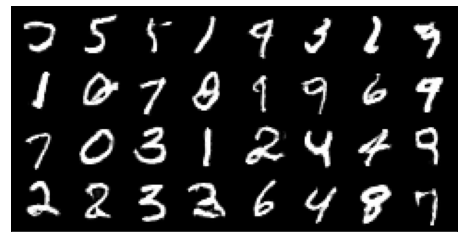

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:32,   G_loss:4.851365824053282,    D_loss:0.1756618915717485


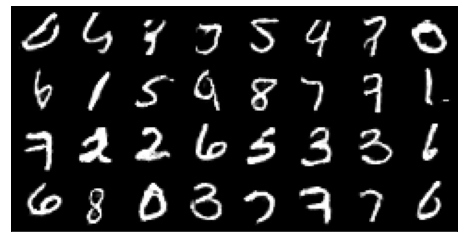

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:33,   G_loss:4.850835429135162,    D_loss:0.12642185637570505


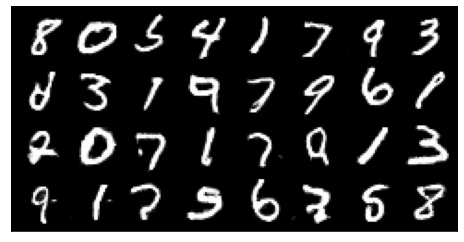

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:34,   G_loss:4.88782172009889,    D_loss:0.18935993371922563


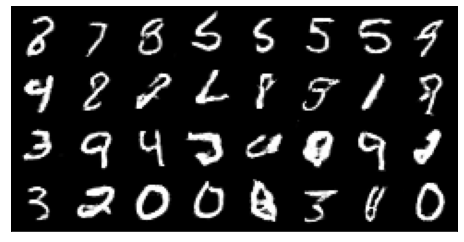

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:35,   G_loss:4.7902035228034325,    D_loss:0.16720295789093573


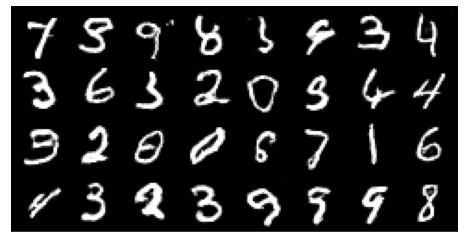

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:36,   G_loss:5.017085496423595,    D_loss:0.12236706957370956


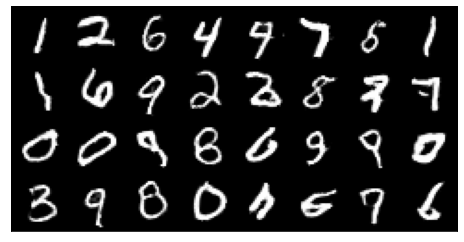

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:37,   G_loss:4.73058141432782,    D_loss:0.19589707717400734


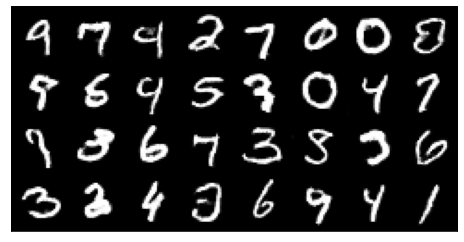

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:38,   G_loss:4.9171127647415664,    D_loss:0.16493526475230005


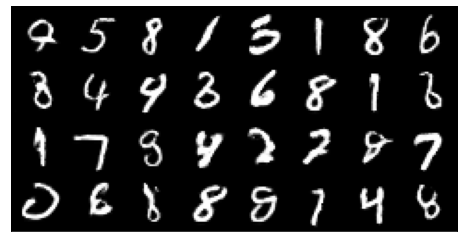

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:39,   G_loss:4.978841013237357,    D_loss:0.13949667772194788


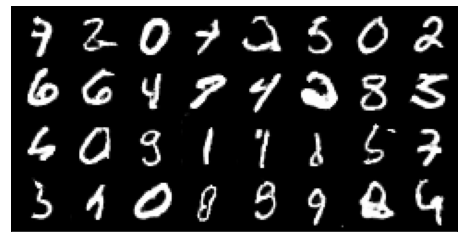

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:40,   G_loss:5.034705435289249,    D_loss:0.16765353500273134


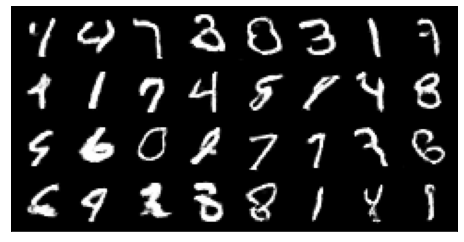

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:41,   G_loss:5.062384125202704,    D_loss:0.11713248444472882


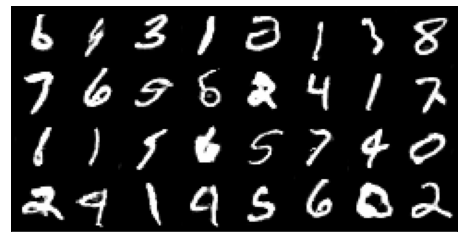

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:42,   G_loss:5.119413280728529,    D_loss:0.12948388109211503


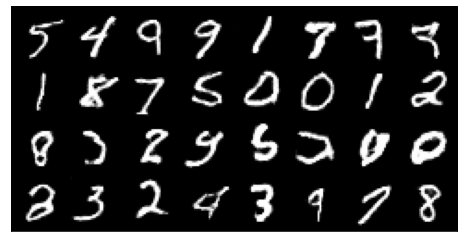

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:43,   G_loss:5.064086651115783,    D_loss:0.14126769276293638


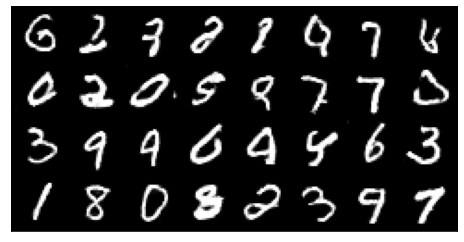

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:44,   G_loss:5.074257139775799,    D_loss:0.1925106213144116


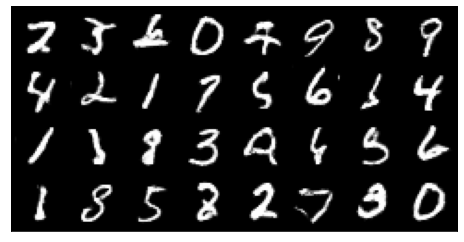

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:45,   G_loss:5.059161693874453,    D_loss:0.14468654863876917


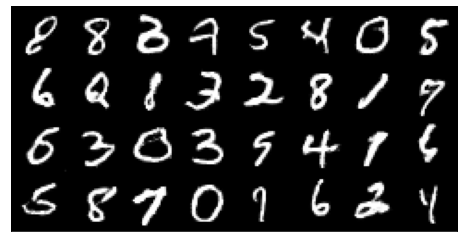

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:46,   G_loss:5.159314042024775,    D_loss:0.1197085545163975


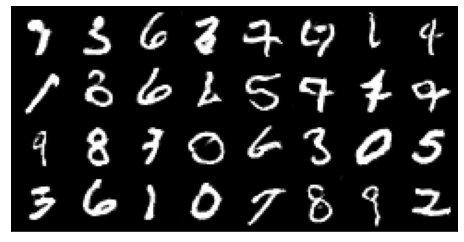

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:47,   G_loss:5.190269946035292,    D_loss:0.15926054981884671


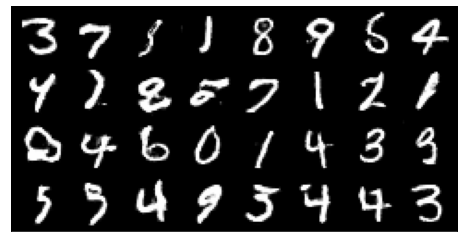

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:48,   G_loss:5.216505339277833,    D_loss:0.14040115713387596


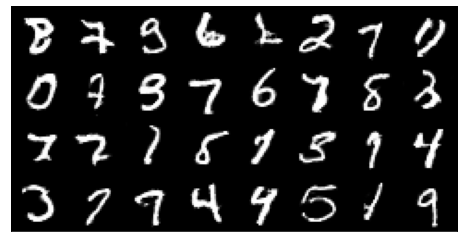

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:49,   G_loss:5.155098261323565,    D_loss:0.12773082404261404


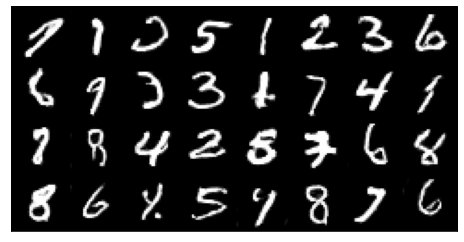

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:50,   G_loss:5.282694926108125,    D_loss:0.14470304609132387


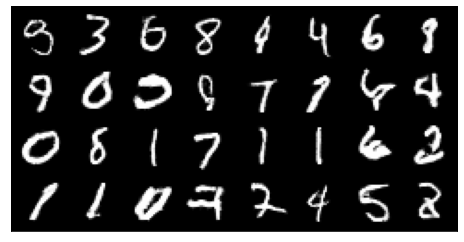

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:51,   G_loss:5.273751245124508,    D_loss:0.15007233416819488


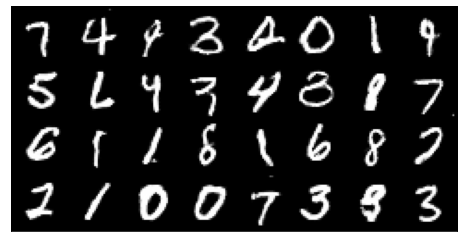

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:52,   G_loss:5.294110000260603,    D_loss:0.12083728969651165


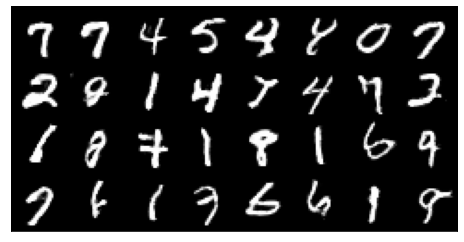

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:53,   G_loss:5.335542498859388,    D_loss:0.12816746115199487


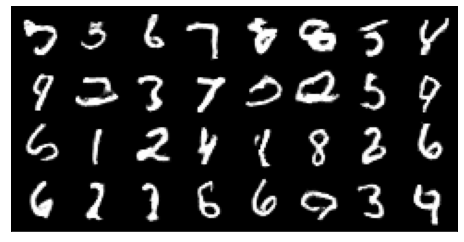

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:54,   G_loss:5.28066642242454,    D_loss:0.1312880137982939


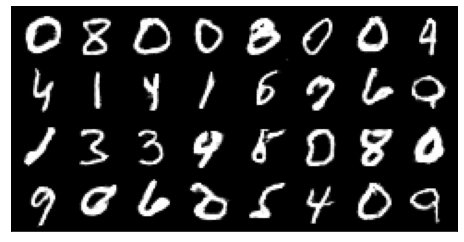

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:55,   G_loss:5.109356668998183,    D_loss:0.18759317313313983


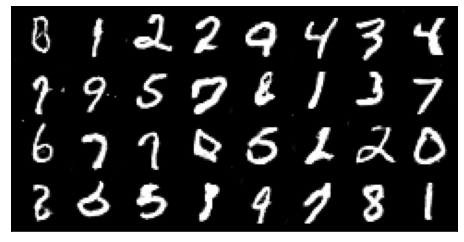

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:56,   G_loss:5.342760187603518,    D_loss:0.15896812887978493


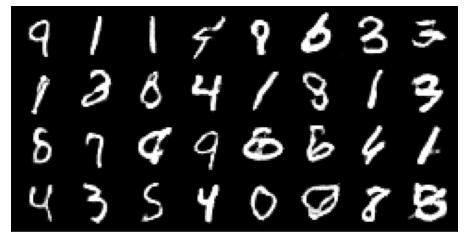

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:57,   G_loss:5.282993890138577,    D_loss:0.10992335564201709


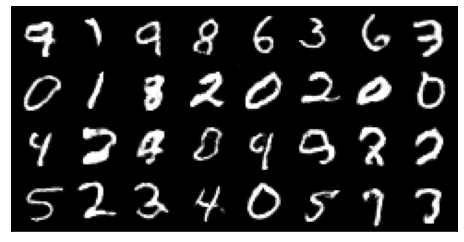

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:58,   G_loss:5.2009692222578945,    D_loss:0.14393924249520798


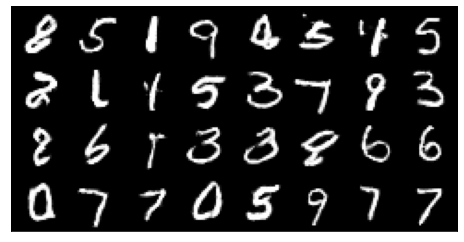

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:59,   G_loss:5.291060055369761,    D_loss:0.16091015753817797


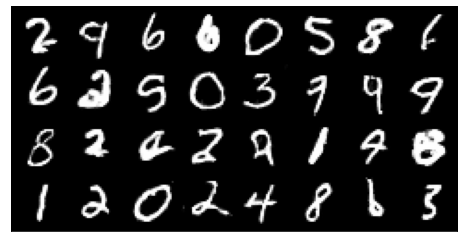

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:60,   G_loss:5.370197333824406,    D_loss:0.12896809177890198


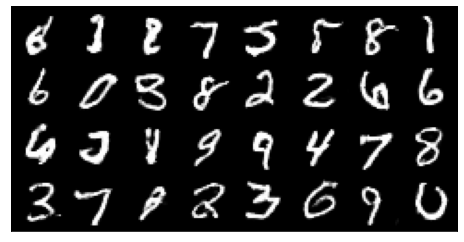

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:61,   G_loss:5.4944533303157606,    D_loss:0.11461492899629319


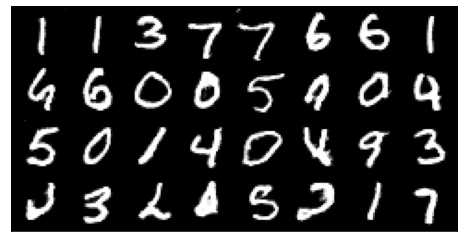

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:62,   G_loss:5.331013816379026,    D_loss:0.14083438371814516


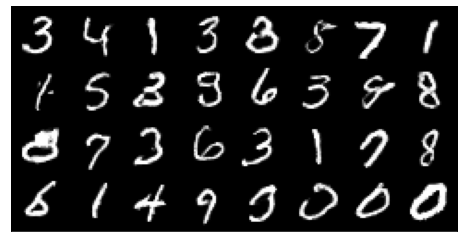

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:63,   G_loss:5.28052822835664,    D_loss:0.15786687431555155


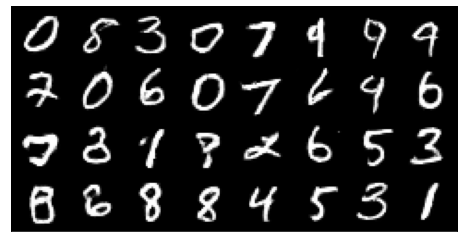

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:64,   G_loss:5.442422160048729,    D_loss:0.1194534857539204


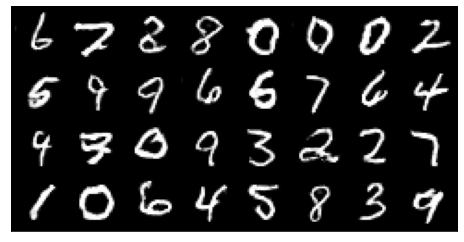

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:65,   G_loss:5.197200697971813,    D_loss:0.1544154322371562


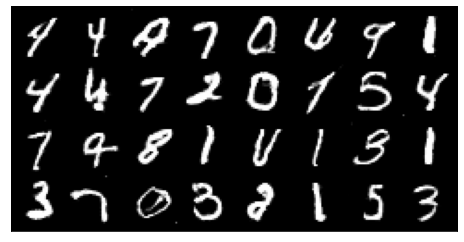

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:66,   G_loss:5.427945012794629,    D_loss:0.10950599160509061


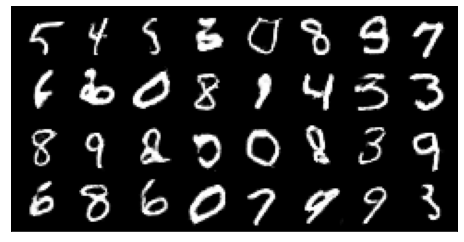

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:67,   G_loss:5.328243182920444,    D_loss:0.16289915535601476


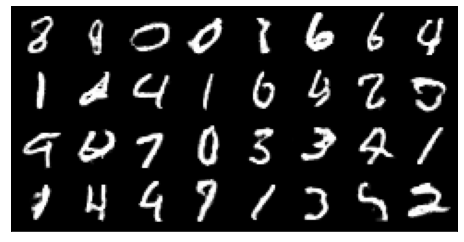

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:68,   G_loss:5.466341924819865,    D_loss:0.07951669472079577


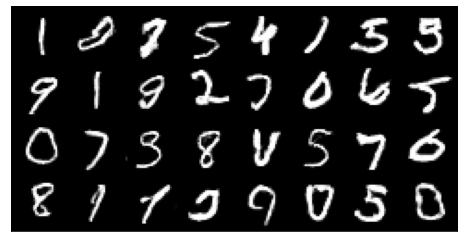

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:69,   G_loss:5.571051629176781,    D_loss:0.1367389433785155


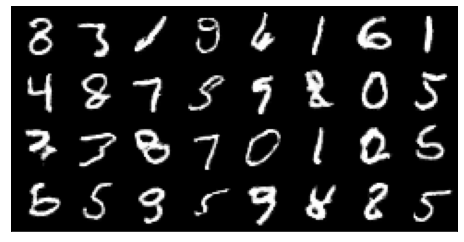

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:70,   G_loss:5.561070715122894,    D_loss:0.120410953662599


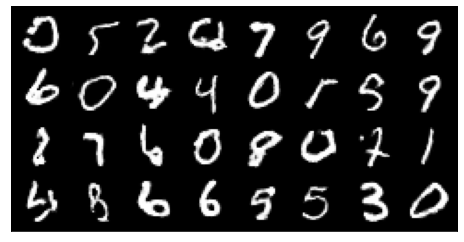

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:71,   G_loss:5.359612173037425,    D_loss:0.1672278285187397


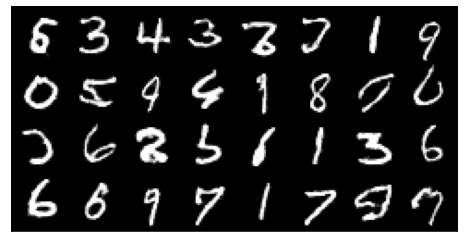

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:72,   G_loss:5.443508233279307,    D_loss:0.130652976588213


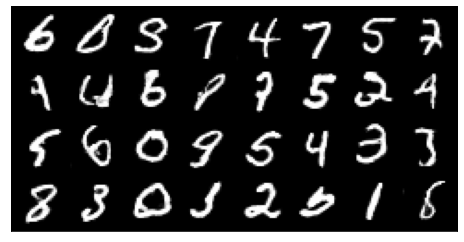

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:73,   G_loss:5.437675059858416,    D_loss:0.10959298437799334


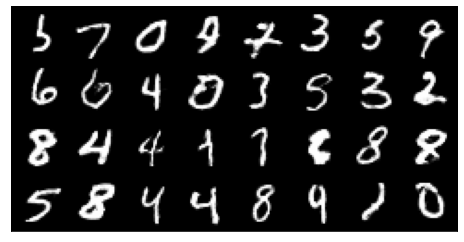

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:74,   G_loss:5.645870222783546,    D_loss:0.11457941393496525


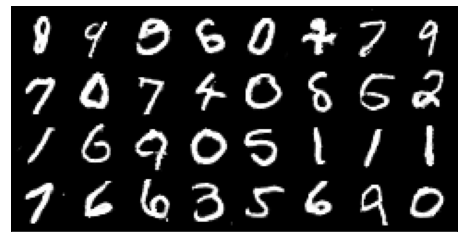

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:75,   G_loss:5.55427180945492,    D_loss:0.1448370799528254


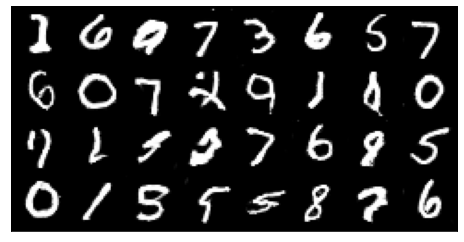

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:76,   G_loss:5.54026166351238,    D_loss:0.1365527525922206


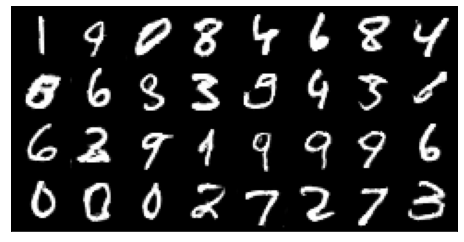

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:77,   G_loss:5.544631462043791,    D_loss:0.09451497114675644


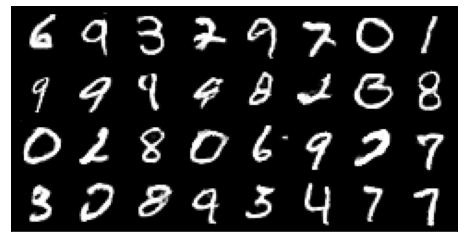

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:78,   G_loss:5.702706012326772,    D_loss:0.10595639571964519


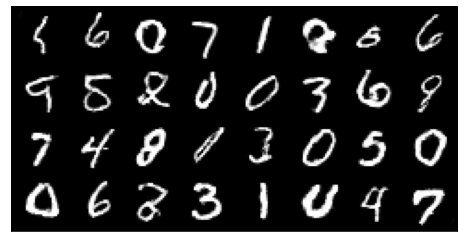

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:79,   G_loss:5.387416578352705,    D_loss:0.14323055388148762


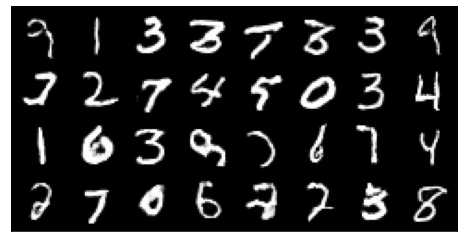

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:80,   G_loss:5.4688449294518815,    D_loss:0.11318037701933992


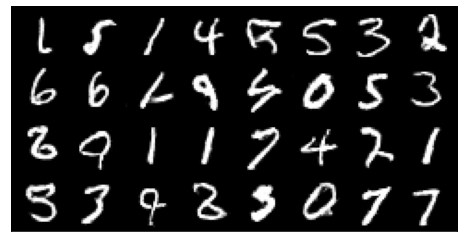

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:81,   G_loss:5.610218612274635,    D_loss:0.16481498079431522


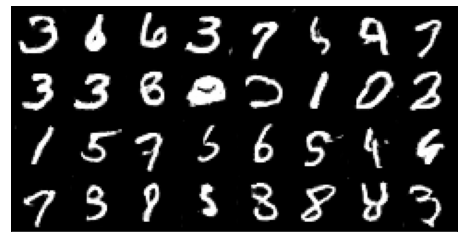

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:82,   G_loss:5.601538225087022,    D_loss:0.10028347274663844


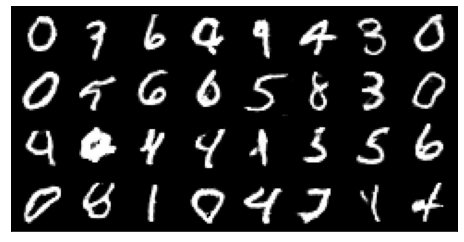

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:83,   G_loss:5.61182049542729,    D_loss:0.1321740310454467


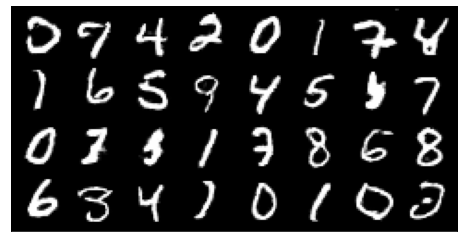

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:84,   G_loss:5.590832773492789,    D_loss:0.09881429621780506


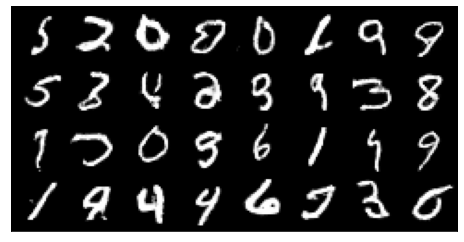

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:85,   G_loss:5.651097215950362,    D_loss:0.17216893228385022


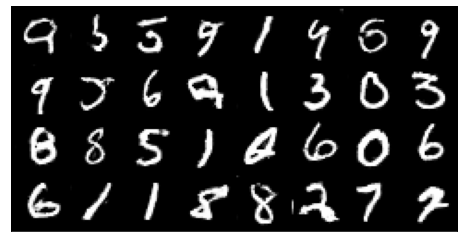

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:86,   G_loss:5.597396053739194,    D_loss:0.0988106125735366


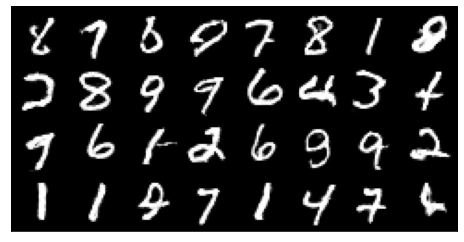

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:87,   G_loss:5.643282059032018,    D_loss:0.12498161447920036


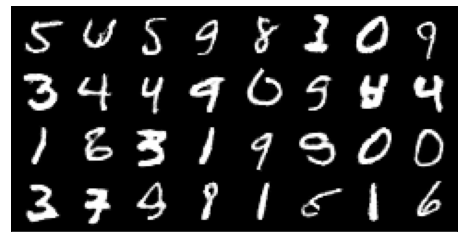

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:88,   G_loss:5.665199333575488,    D_loss:0.11150005804861325


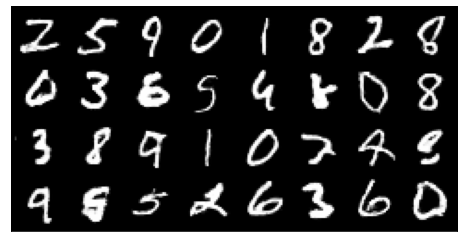

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:89,   G_loss:5.675830656785701,    D_loss:0.12838200467843702


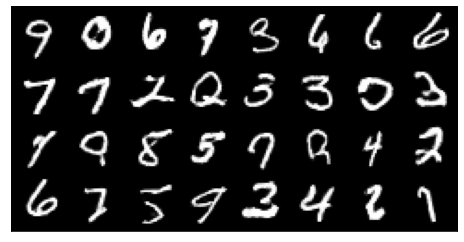

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:90,   G_loss:5.622386900537304,    D_loss:0.09772869772518546


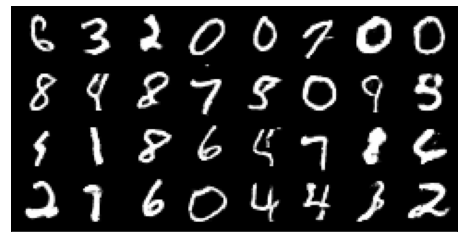

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:91,   G_loss:5.7359660613034835,    D_loss:0.1598250146972379


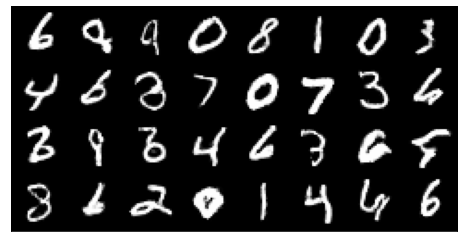

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:92,   G_loss:5.652545746582658,    D_loss:0.08276742788553952


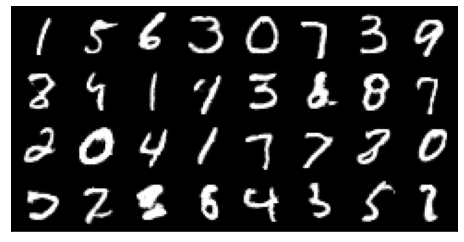

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:93,   G_loss:5.879299494979986,    D_loss:0.10187594633422115


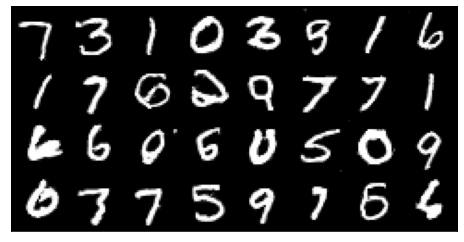

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:94,   G_loss:5.643690878775582,    D_loss:0.1316198128341848


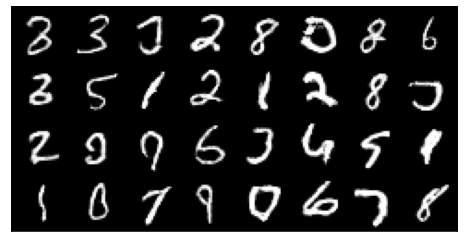

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:95,   G_loss:5.822905305923937,    D_loss:0.11510154391442344


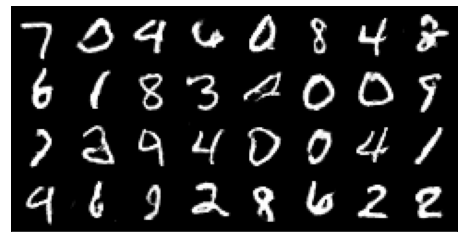

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:96,   G_loss:5.7246113903741085,    D_loss:0.10424980720733977


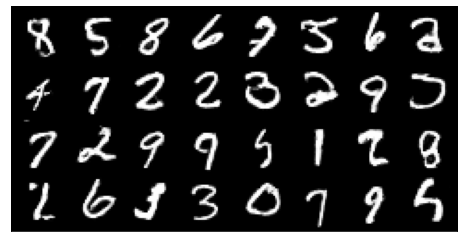

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:97,   G_loss:5.679511640880154,    D_loss:0.12832003875736342


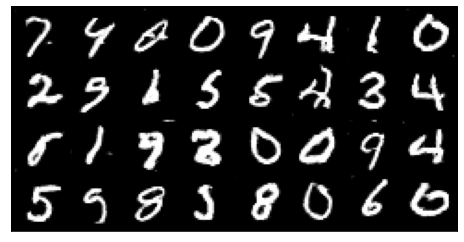

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:98,   G_loss:5.724475935308028,    D_loss:0.1376132281039899


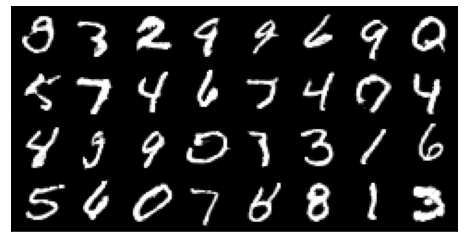

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Epoch:99,   G_loss:5.713735811618854,    D_loss:0.10785134668916967


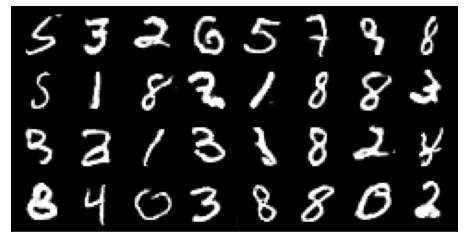

In [15]:
for epoch in range(100):
    G_loss_run = 0.0
    D_loss_run = 0.0
    for i, data in enumerate(trainLoader):
        X, _ = data
        X = X.to(device)
        mb_size = X.size(0)
        #print(X.shape)
        
        
        one_labels = torch.ones(mb_size, 1).to(device)
        zero_labels = torch.zeros(mb_size, 1).to(device)
        
        z = torch.randn(mb_size, 100,1,1).to(device)
        
        D_real = D(X)
        D_fake = D(G(z))

        D_real= torch.reshape(D_real, (mb_size, 1))
        D_fake= torch.reshape(D_fake, (mb_size, 1))
        #print(D_real.shape)
        #print(D_fake.shape)
        #break
        
        D_real_loss = F.binary_cross_entropy(D_real, one_labels)
        D_fake_loss = F.binary_cross_entropy(D_fake, zero_labels)
        D_loss = D_real_loss + D_fake_loss
        
        d_opt.zero_grad()
        D_loss.backward()
        d_opt.step()
        
        z = torch.randn(mb_size, 100,1,1).to(device)
        D_fake = D(G(z))
        D_fake= torch.reshape(D_fake, (mb_size, 1))
        G_loss = F.binary_cross_entropy(D_fake, one_labels)
        
        g_opt.zero_grad()
        G_loss.backward()
        g_opt.step()
        
        G_loss_run += G_loss.item()
        D_loss_run += D_loss.item()
        
    print('Epoch:{},   G_loss:{},    D_loss:{}'.format(epoch, G_loss_run/(i+1), D_loss_run/(i+1)))

    writer.add_scalar('Generator loss',G_loss_run,epoch)
    writer.add_scalar('Discriminator loss',D_loss_run,epoch)
                          
    
    samples = G(z).detach()
    samples = samples.view(samples.size(0), 1, 28, 28).cpu()
    img_grid = torchvision.utils.make_grid(samples)

    imshow(samples)
    writer.add_image('generated_images', img_grid,epoch)
writer.close() 



In [16]:
G_checkpoint = {'model': G,
          'state_dict': G.state_dict(),
          'loss' : G_loss_run,
          'optimizer' : g_opt.state_dict()}


PATH = "/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST/Weights/G_checkpoint_latest_" + str(epoch) + ".pth"
torch.save(G_checkpoint, PATH)



#Example for saving a checkpoint 
D_checkpoint = {'model': D,
          'state_dict': D.state_dict(),
          'loss' : D_loss_run,
          'optimizer' : d_opt.state_dict()}


PATH = "/content/gdrive/MyDrive/Github/CounterFactuals_GANs/MNIST/Weights/D_checkpoint_latest_" + str(epoch) + ".pth"
torch.save(D_checkpoint, PATH)


In [17]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [18]:
!git status

On branch main
Your branch is up to date with 'origin/main'.

Untracked files:
  (use "git add <file>..." to include in what will be committed)

	Training the GAN.ipynb
	Weights/
	__pycache__/
	data/
	runs/

nothing added to commit but untracked files present (use "git add" to track)


In [20]:
!git add .

In [21]:
!git commit -m "DC GAN trained till 100 epochs"


*** Please tell me who you are.

Run

  git config --global user.email "you@example.com"
  git config --global user.name "Your Name"

to set your account's default identity.
Omit --global to set the identity only in this repository.

fatal: unable to auto-detect email address (got 'root@d6cc675c2e34.(none)')


In [22]:
 git config --global user.email "mpattadkal@gmail.com"

SyntaxError: ignored